# Urban Change Detection — Gauteng 2016 vs 2026
## Landsat 8 (2016) vs Landsat 9 (2026)

This section serves as a continuation from [NDBI — Mapping Urban Surfaces in Gauteng](). Over the past decade Gauteng has undergone rapid urban transformation driven by population growth, infrastructure investment, and the outward expansion of Johannesburg, Tshwane, and Ekurhuleni. In this section we use satellite imagery to quantify and visualise that change.

The approach is based on the **Differenced Normalized Difference Built-up Index (dNDBI)** — a method that computes NDBI independently for two dates and subtracts one from the other. Where the value increases between dates, the surface has become more urban. Where it decreases, vegetation has recovered or land use has shifted away from impervious surfaces.

We compare two Landsat scenes acquired in **February 2016 (Landsat 8)** and **February 2026 (Landsat 9)**. Choosing the same calendar month for both dates is deliberate because it minimises differences in vegetation greenness that would otherwise introduce noise into the change signal and make it harder to attribute detected differences to genuine land cover change rather than seasonal variation.

The goal here is to produce:

- A continuous dNDBI map showing the magnitude of change across the scene
- A classified map categorising pixels into meaningful change classes
- A side-by-side comparison of NDBI for both dates
- An interactive map we can zoom and explore to investigate specific areas
- Area statistics quantifying how much of Gauteng changed and in which direction

Lets get started and see what we come up with.

### Options and libraries

In [1]:
options(
  repr.plot.width  = 13,
  repr.plot.height = 9,
  repr.plot.res    = 200
)

In [3]:
library(tidyverse)
library(terra)
library(sf)
library(scales)
library(leaflet)
library(htmlwidgets)
library(patchwork)

### Load & scale both Landsat scenes

Landsat Collection 2 Level-2 scale factors are identical for L8 and L9: `Surface Reflectance = DN * 0.0000275 - 0.2`

Pixels below 0 after scaling are fill or cloud — masked to NA

In [4]:
BandNamesShort <- c("B1_Coastal", "B2_Blue",  "B3_Green",
                    "B4_Red",     "B5_NIR",   "B6_SWIR1", "B7_SWIR2")

In [5]:
# Function to load data and apply scale factor
load_landsat <- function(directory, base_name) {
  paths <- paste0(directory, "/", base_name, 1:7, ".TIF")
  stopifnot("Some band files are missing" = all(file.exists(paths)))
  stack <- rast(paths) * 0.0000275 - 0.2
  stack[stack < 0] <- NA
  names(stack) <- BandNamesShort
  stack
}

In [6]:
# 2026 scene — Landsat 9
Dir2026  <- "Data/Gauteng_Landsat"
Base2026 <- "LC09_L2SP_170078_20260210_20260211_02_T1_SR_B"
Stack2026 <- load_landsat(Dir2026, Base2026)

In [7]:
print(Stack2026)

class       : SpatRaster 
size        : 7821, 7751, 7  (nrow, ncol, nlyr)
resolution  : 30, 30  (x, y)
extent      : 533085, 765615, -2993415, -2758785  (xmin, xmax, ymin, ymax)
coord. ref. : WGS 84 / UTM zone 35N (EPSG:32635) 
source      : spat_1f78534fe059_8056_CjcR62DykkoqBId.tif 
names       :   B1_Coastal,      B2_Blue,     B3_Green,       B4_Red,       B5_NIR,     B6_SWIR1, ... 
min values  : 7.498264e-06, 7.498264e-06, 7.498264e-06, 7.498264e-06, 7.498264e-06, 7.498264e-06, ... 
max values  : 1.374622e+00, 1.377482e+00, 1.470405e+00, 1.446782e+00, 1.444500e+00, 1.511050e+00, ... 


In [8]:
# 2016 scene — Landsat 8
Dir2016  <- "Data/Gauteng_Landsat2016"
Base2016 <- "LC08_L2SP_170078_20160207_20200907_02_T1_SR_B"
Stack2016 <- load_landsat(Dir2016, Base2016)

In [9]:
print(Stack2016)

class       : SpatRaster 
size        : 7841, 7751, 7  (nrow, ncol, nlyr)
resolution  : 30, 30  (x, y)
extent      : 535185, 767715, -2993715, -2758485  (xmin, xmax, ymin, ymax)
coord. ref. : WGS 84 / UTM zone 35N (EPSG:32635) 
source      : spat_1f78464f7772_8056_5pGMXuK8e3IyZ5Z.tif 
names       :   B1_Coastal,      B2_Blue,     B3_Green,       B4_Red,       B5_NIR,     B6_SWIR1, ... 
min values  : 7.498264e-06, 7.498264e-06, 3.500581e-05, 7.498264e-06, 7.498264e-06, 7.498264e-06, ... 
max values  : 1.156025e+00, 1.258380e+00, 1.256400e+00, 1.336700e+00, 1.428880e+00, 1.510967e+00, ... 


### Compute NDBI for each date

The formula for calculating NDBI is as follows:

$$NDBI = \frac{(SWIR1 - NIR)}{(SWIR1 + NIR)} = \frac{(B6 - B5)}{(B6 + B5)}$$

In [10]:
compute_ndbi <- function(stack) {
  swir1 <- stack[["B6_SWIR1"]]
  nir   <- stack[["B5_NIR"]]
  ndbi  <- (swir1 - nir) / (swir1 + nir)
  names(ndbi) <- "NDBI"
  ndbi
}

In [11]:
NDBI_2026 <- compute_ndbi(Stack2026)
NDBI_2016 <- compute_ndbi(Stack2016)

In [12]:
print(global(NDBI_2026, "range", na.rm = TRUE))

            min       max
NDBI -0.9981959 0.9994555


In [13]:
print(global(NDBI_2016, "range", na.rm = TRUE))

            min       max
NDBI -0.9996771 0.9989741


You may have or may not have noticed that we are creating functions more often that we have been in previous sections. This is to limit the amount of code we write; we already have two different datasets with similar structures, creating functions that will do the same work on both datasets becomes more effective.

### Align 2016 scene to 2026 reference

The two scenes may have tiny CRS or extent differences despite being the same path/row. We reproject 2016 onto the 2026 grid to ensure pixel-perfect alignment before subtraction. `method = "bilinear"` is fine for continuous data.

In [14]:
NDBI_2016_Aligned <- project(NDBI_2016, NDBI_2026, method = "bilinear")

In [15]:
cat("2026 extent:", as.character(ext(NDBI_2026)), "\n")

2026 extent: ext(533085, 765615, -2993415, -2758785) 


In [16]:
cat("2016 extent:", as.character(ext(NDBI_2016_Aligned)), "\n")

2016 extent: ext(533085, 765615, -2993415, -2758785) 


Great! Our grids are perfectly aligned.

### Compute dNDBI (change raster)

Points to take note of:

- dNDBI = NDBI_2026 - NDBI_2016
- Positive = increase in built-up signal (urban gain)
- Negative = decrease in built-up signal (vegetation recovery / demolition)

In [17]:
dNDBI <- NDBI_2026 - NDBI_2016_Aligned
names(dNDBI) <- "dNDBI"

In [18]:
print(global(dNDBI, c("min","max","mean","sd"), na.rm = TRUE))

            min      max       mean        sd
dNDBI -1.678389 1.800744 -0.0378874 0.1388644


### Classify change into meaningful categories

Thresholds are based on ±1 SD of the dNDBI distribution which adapts to the actual change magnitude in this specific scene rather than using arbitrary fixed values. We compute SD first then use it to set breaks.

In [19]:
dNDBI_Sd   <- global(dNDBI, "sd",   na.rm = TRUE)[[1]]
dNDBI_Mean <- global(dNDBI, "mean", na.rm = TRUE)[[1]]

In [20]:
# Classification thresholds
Thresh_HighGain  <-  dNDBI_Sd * 1.5
Thresh_Gain      <-  dNDBI_Sd * 0.5
Thresh_Loss      <- -dNDBI_Sd * 0.5
Thresh_HighLoss  <- -dNDBI_Sd * 1.5

In [21]:
cat("\n Change thresholds: \n")
cat("  High urban gain  > ", round(Thresh_HighGain, 4), "\n")
cat("  Urban gain       > ", round(Thresh_Gain,     4), "\n")
cat("  No change          (between ±", round(Thresh_Gain, 4), ")\n")
cat("  Urban loss       < ", round(Thresh_Loss,     4), "\n")
cat("  High urban loss  < ", round(Thresh_HighLoss, 4), "\n")


 Change thresholds: 
  High urban gain  >  0.2083 
  Urban gain       >  0.0694 
  No change          (between ± 0.0694 )
  Urban loss       <  -0.0694 
  High urban loss  <  -0.2083 


In [22]:
dNDBI_Classified <- classify(
  dNDBI,
  rcl = matrix(c(
    -Inf,          Thresh_HighLoss, 1,
    Thresh_HighLoss, Thresh_Loss,  2,
    Thresh_Loss,   Thresh_Gain,    3,
    Thresh_Gain,   Thresh_HighGain,4,
    Thresh_HighGain, Inf,          5
  ), ncol = 3, byrow = TRUE)
)

names(dNDBI_Classified) <- "class"

### Reproject all rasters

If you remember from the previous section, The latitudes and Longitude values were very high in the hundreds of thousands and milltions. The reason behind that was because the rasters were still in the **South African Albers Equal Area projection (metres)** rather than geographic coordinates (degrees). To fix that, all we have to do is to reproject the rasters to WGS84 before converting to a data frame.

In [23]:
# Reproject all rasters to WGS84 (EPSG:4326) so axes show degrees
NDBI_2026         <- project(NDBI_2026,          "EPSG:4326", method = "bilinear")
NDBI_2016_Aligned <- project(NDBI_2016_Aligned,  "EPSG:4326", method = "bilinear")
dNDBI             <- project(dNDBI,               "EPSG:4326", method = "bilinear")
dNDBI_Classified  <- project(dNDBI_Classified,    "EPSG:4326", method = "near")

Note that `dNDBI_Classified` uses `method = "near"` because it is categorical — nearest neighbour preserves the integer class codes. The other three use "bilinear" because they are continuous.

### Convert rasters to data frames for `{ggplot2}`

We aggregate slightly before converting to reduce memory pressure. Factor 2 halves the resolution — still visually sharp for Gauteng's extent.

In [24]:
prep_df <- function(raster, value_col) {
  raster %>%
    aggregate(fact = 2, fun = "mean") %>%
    as.data.frame(xy = TRUE) %>%
    as_tibble() %>%
    rename(x = x, y = y, value = all_of(names(.)[3])) %>%
    filter(!is.na(value))
}

In [25]:
dNDBI_Df         <- prep_df(dNDBI)
NDBI2026_Df      <- prep_df(NDBI_2026)
NDBI2016_Df      <- prep_df(NDBI_2016_Aligned)
Classified_Df    <- prep_df(dNDBI_Classified)

In [26]:
# Add category labels to classified data frame
CategoryLevels <- c(
  "High Urban Loss",
  "Urban Loss",
  "No Significant Change",
  "Urban Gain",
  "High Urban Gain"
)

In [27]:
Classified_Df <- Classified_Df %>%
  mutate(
    category = factor(
      CategoryLevels[as.integer(round(value))],
      levels = CategoryLevels
    )
  )

In [28]:
# Pixel counts per change category
print(count(Classified_Df, category))

# A tibble: 5 × 2
  category                    n
  <fct>                   <int>
1 High Urban Loss        682413
2 Urban Loss            3580678
3 No Significant Change 3889995
4 Urban Gain            1601009
5 High Urban Gain        311879


### Plot continuous dNDBI map

In [29]:
Plot_Continuous <- dNDBI_Df %>%
  ggplot(aes(x = x, y = y, fill = value)) +
  geom_raster() +
  scale_fill_gradientn(
    colours  = c("#1a5276", "#2e86c1", "#aed6f1", "#fdfefe",
                 "#f9e79f", "#e67e22", "#922b21"),
    values   = rescale(c(-0.4, -0.2, -0.05, 0, 0.05, 0.2, 0.4)),
    limits   = c(-0.4, 0.4),
    oob      = squish,
    name     = "dNDBI",
    guide    = guide_colourbar(
      title.position = "top",
      title.hjust    = 0.5,
      barwidth       = unit(9, "cm"),
      barheight      = unit(0.45, "cm"),
      ticks.colour   = "white",
      frame.colour   = "white"
    )
  ) +
  coord_equal() +
  labs(
    title    = "Urban Change Detection — Gauteng 2016 vs 2026",
    subtitle = "dNDBI = NDBI₂₀₂₆ − NDBI₂₀₁₆  ·  Warm = urban gain  ·  Cool = urban loss",
    caption  = "Landsat 8 (Feb 2016) vs Landsat 9 (Feb 2026)  ·  Band 6 & 5  ·  USGS Collection 2 Level-2",
    x = "Longitude", y = "Latitude"
  ) +
  theme_minimal(base_family = "sans") +
  theme(
    plot.background  = element_rect(fill = "#070b1a", colour = NA),
    panel.background = element_rect(fill = "#070b1a", colour = NA),
    panel.grid       = element_blank(),
    panel.border     = element_rect(colour = "#ffffff18", fill = NA, linewidth = 0.5),
    plot.title       = element_text(colour = "#eceff1", face = "bold", size = 14,
                                    margin = margin(b = 4)),
    plot.subtitle    = element_text(colour = "#78909c", size = 9, margin = margin(b = 8)),
    plot.caption     = element_text(colour = "#546e7a", size = 7.5),
    axis.text        = element_text(colour = "#90a4ae", size = 7.5),
    axis.title       = element_text(colour = "#b0bec5", size = 9),
    legend.position  = "bottom",
    legend.background = element_rect(fill = "#070b1a", colour = NA),
    legend.title     = element_text(colour = "#eceff1", size = 9, face = "bold"),
    legend.text      = element_text(colour = "#90a4ae", size = 8),
    plot.margin      = margin(14, 16, 12, 14)
  )

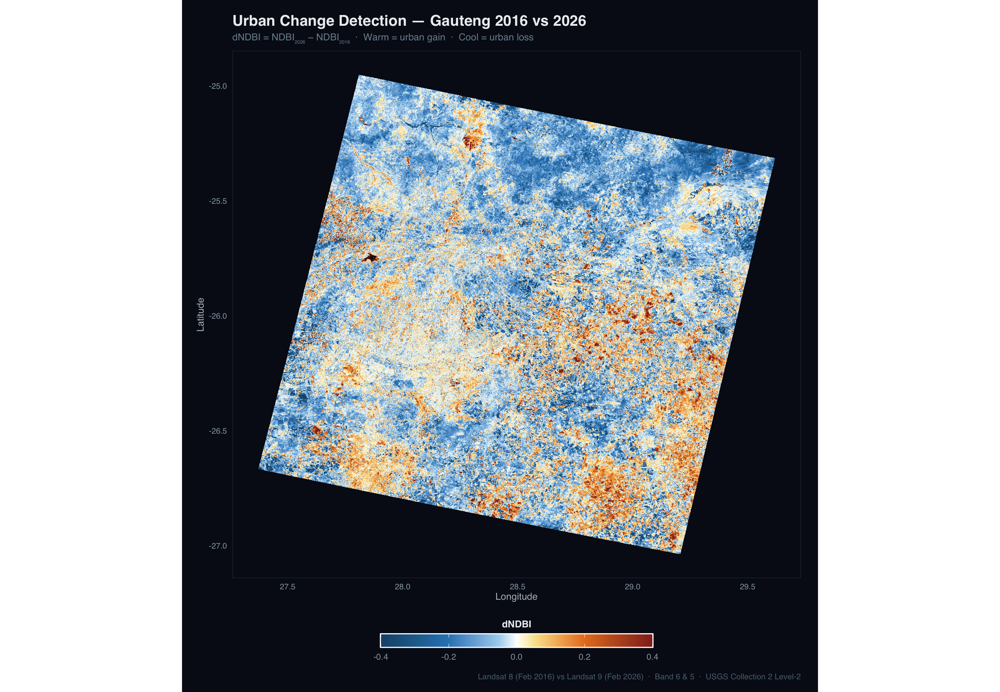

In [30]:
print(Plot_Continuous)

And there we have our map with latitude and longitude in degrees.

### Plot classified change map

In [31]:
CategoryColours <- c(
  "High Urban Loss"        = "#1a5276",
  "Urban Loss"             = "#5dade2",
  "No Significant Change"  = "#1c2833",
  "Urban Gain"             = "#e67e22",
  "High Urban Gain"        = "#922b21"
)

In [32]:
Plot_Classified <- Classified_Df %>%
  ggplot(aes(x = x, y = y, fill = category)) +
  geom_raster() +
  scale_fill_manual(
    values = CategoryColours,
    name   = "Change Category",
    guide  = guide_legend(
      title.position = "top",
      title.hjust    = 0.5,
      nrow           = 2
    )
  ) +
  coord_equal() +
  labs(
    title    = "Classified Urban Change — Gauteng 2016 vs 2026",
    subtitle = "10-year urban expansion detected via dNDBI  ·  Landsat 8 → Landsat 9",
    caption  = "Thresholds set at ±0.5 SD and ±1.5 SD of the dNDBI distribution",
    x = "Longitude", y = "Latitude"
  ) +
  theme_minimal(base_family = "sans") +
  theme(
    plot.background  = element_rect(fill = "#070b1a", colour = NA),
    panel.background = element_rect(fill = "#070b1a", colour = NA),
    panel.grid       = element_blank(),
    panel.border     = element_rect(colour = "#ffffff18", fill = NA, linewidth = 0.5),
    plot.title       = element_text(colour = "#eceff1", face = "bold", size = 14,
                                    margin = margin(b = 4)),
    plot.subtitle    = element_text(colour = "#78909c", size = 9, margin = margin(b = 8)),
    plot.caption     = element_text(colour = "#546e7a", size = 7.5),
    axis.text        = element_text(colour = "#90a4ae", size = 7.5),
    axis.title       = element_text(colour = "#b0bec5", size = 9),
    legend.position  = "bottom",
    legend.background = element_rect(fill = "#070b1a", colour = NA),
    legend.title     = element_text(colour = "#eceff1", size = 9, face = "bold"),
    legend.text      = element_text(colour = "#b0bec5", size = 9),
    plot.margin      = margin(14, 16, 12, 14)
  )

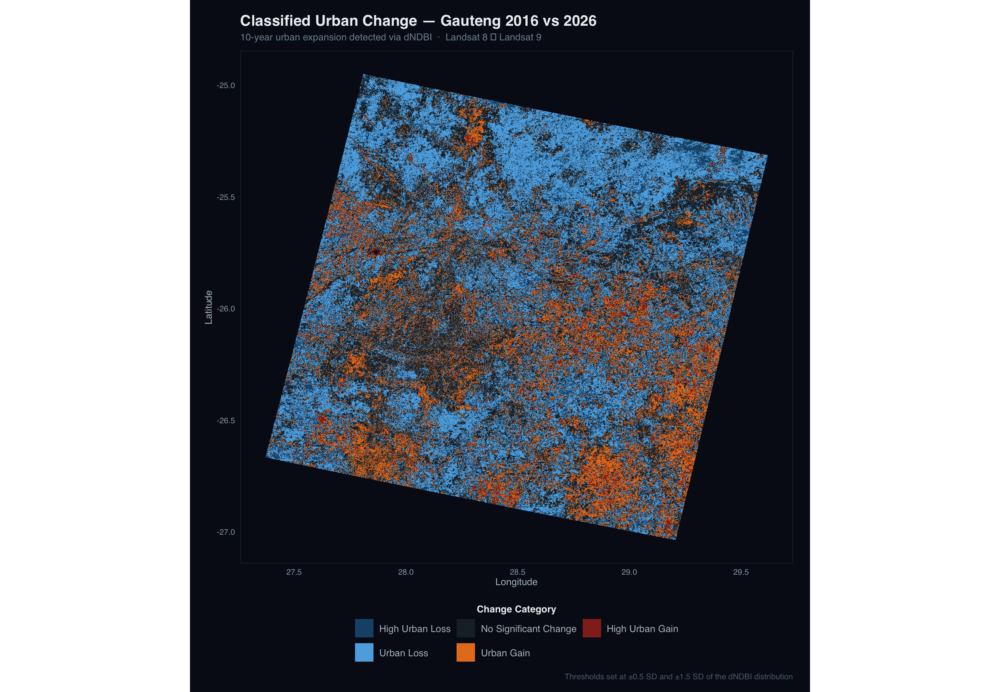

In [33]:
print(Plot_Classified)

### Side-by-side NDBI comparison panel

Showing both dates next to each other with the same colour scale lets us visually trace where urban expansion occurred without needing to interpret the difference raster at all.

In [34]:
NdbiPalette <- function(...) {
  scale_fill_gradientn(
    colours = c("#1a5276", "#aed6f1", "#f9f9f9", "#f0b27a", "#922b21"),
    values  = rescale(c(-1, -0.1, 0, 0.1, 1)),
    limits  = c(-0.5, 0.5),
    oob     = squish,
    name    = "NDBI",
    guide   = guide_colourbar(
      title.position = "top", title.hjust = 0.5,
      barwidth = unit(6, "cm"), barheight = unit(0.4, "cm"),
      ticks.colour = "white", frame.colour = "white"
    ),
    ...
  )
}

In [35]:
SharedTheme <- theme_minimal(base_family = "sans") +
  theme(
    plot.background  = element_rect(fill = "#070b1a", colour = NA),
    panel.background = element_rect(fill = "#070b1a", colour = NA),
    panel.grid       = element_blank(),
    panel.border     = element_rect(colour = "#ffffff18", fill = NA, linewidth = 0.5),
    plot.title       = element_text(colour = "#eceff1", face = "bold", size = 12,
                                    margin = margin(b = 4)),
    plot.subtitle    = element_text(colour = "#78909c", size = 8),
    axis.text        = element_text(colour = "#90a4ae", size = 7),
    axis.title       = element_text(colour = "#b0bec5", size = 8),
    legend.position  = "bottom",
    legend.background = element_rect(fill = "#070b1a", colour = NA),
    legend.title     = element_text(colour = "#eceff1", size = 8, face = "bold"),
    legend.text      = element_text(colour = "#90a4ae", size = 7.5),
    plot.margin      = margin(10, 12, 10, 12)
  )

In [36]:
Panel2016 <- NDBI2016_Df %>%
  ggplot(aes(x = x, y = y, fill = value)) +
  geom_raster() +
  NdbiPalette() +
  coord_equal() +
  labs(title = "NDBI — February 2016",
       subtitle = "Landsat 8 · Pre-change baseline",
       x = "Longitude", y = "Latitude") +
  SharedTheme

In [37]:
Panel2026 <- NDBI2026_Df %>%
  ggplot(aes(x = x, y = y, fill = value)) +
  geom_raster() +
  NdbiPalette() +
  coord_equal() +
  labs(title = "NDBI — February 2026",
       subtitle = "Landsat 9 · Post-change comparison",
       x = "Longitude", y = "Latitude") +
  SharedTheme

In [38]:
ComparisonPanel <- Panel2016 + Panel2026 +
  plot_layout(guides = "collect") +
  plot_annotation(
    title    = "NDBI Comparison — Gauteng Urban Expansion 2016 → 2026",
    subtitle = "Same colour scale applied to both dates for direct visual comparison",
    caption  = "Landsat 8 (Feb 2016) & Landsat 9 (Feb 2026)  ·  USGS Collection 2 Level-2",
    theme    = theme(
      plot.background = element_rect(fill = "#070b1a", colour = NA),
      plot.title      = element_text(colour = "#eceff1", face = "bold", size = 14),
      plot.subtitle   = element_text(colour = "#78909c", size = 9),
      plot.caption    = element_text(colour = "#546e7a", size = 7.5)
    )
  ) &
  theme(legend.position = "bottom")

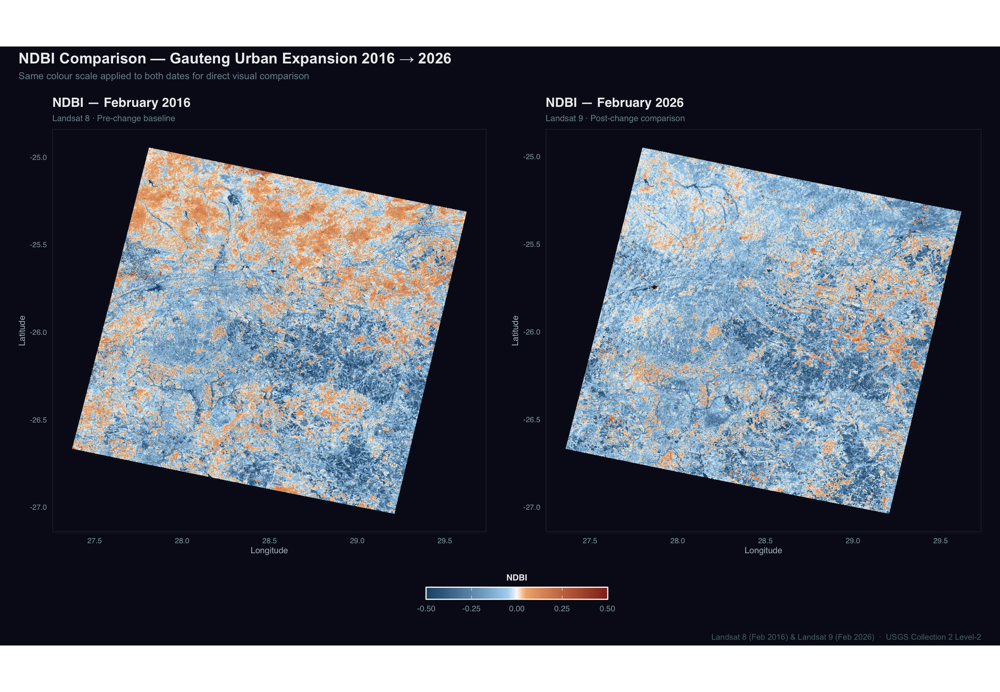

In [39]:
print(ComparisonPanel)

### Area statistics summary

I will advice to add area statistics to show how much of the land in a particular area changed.

In [40]:
PixelArea_km2 <- (30 * 2)^2 / 1e6  # 30m Landsat * aggregation factor 2

AreaStats <- Classified_Df %>%
  count(category) %>%
  mutate(
    pct      = round(n / sum(n) * 100, 1),
    area_km2 = round(n * PixelArea_km2, 1)
  ) %>%
  arrange(category)

In [41]:
cat("\n Area statistics 2016 → 2026 \n")
print(AreaStats)


 Area statistics 2016 → 2026 
# A tibble: 5 × 4
  category                    n   pct area_km2
  <fct>                   <int> <dbl>    <dbl>
1 High Urban Loss        682413   6.8    2457.
2 Urban Loss            3580678  35.6   12890.
3 No Significant Change 3889995  38.6   14004 
4 Urban Gain            1601009  15.9    5764.
5 High Urban Gain        311879   3.1    1123.


In [42]:
# Net urban change
NetGain <- AreaStats %>%
  filter(str_detect(category, "Gain")) %>%
  summarise(total_km2 = sum(area_km2)) %>%
  pull(total_km2)

NetLoss <- AreaStats %>%
  filter(str_detect(category, "Loss")) %>%
  summarise(total_km2 = sum(area_km2)) %>%
  pull(total_km2)

In [43]:
cat("\n Net change summary \n")
cat("  Total urban gain :", NetGain, "km²\n")
cat("  Total urban loss :", NetLoss, "km²\n")
cat("  Net urban change :", round(NetGain - NetLoss, 1), "km²\n")


 Net change summary 
  Total urban gain : 6886.4 km²
  Total urban loss : 15347.1 km²
  Net urban change : -8460.7 km²


The results are quite intriguing because they are actually telling a very interesting and somewhat counterintuitive story.

Even though we were looking to see urban expansion in Gauteng, the net urban change of −8,460 km² tells us a different story. It does not mean Gauteng shrank, it means the NDBI signal decreased on average across the scene, which sounds alarming but has should have a plausible explanation.

What I can think of as the most likely explaination is vegetation recovery. Febraury is one of the summer rainfall months in Gauteng, meaning it experiences most rainfall in the form of heavy afternoon thunderstorms. If February 2026 had significantly higher rainfall or a wetter preceding season than February 2016, vegetation would be substantially greener in 2026. Green vegetation strongly suppresses NDBI because it boosts the NIR reflectance and reduces the SWIR reflectance simultaneously, pushing values negative. This would show up in our results as widespread apparent "urban loss" even in areas that have clearly urbanised.

This is precisely the seasonal sensitivity limitation we flagged in the [NDBI — Mapping Urban Surfaces in Gauteng]() — and our results are a clear demonstration of it.

To have a more robust analysis, we would have to try and incorporate multiple dates, cloud masking, and ideally a vegetation index alongside NDBI to separate genuine urban change from vegetation-driven NDBI suppression. But I don't feel like doing all that so it will be a story for another day.😭👍

### Interactive leaflet change map

There was something I wanted to try. I wanted to try and place the raster on top an ESRI or Google map which which clearly point out which path on Gauteng the satellite image is from and make it interactive as well.

To do that we will have to convert the classified raster to a colour-mapped PNG tile layer so that leaflet can display it as an interactive overlay. This way we can zoom and pan to inspect specific areas of change — much more useful for a class than a static map when exploring a large scene like Gauteng.

In [44]:
# Aggregate more before passing to leaflet — reduces file size dramatically
# fact = 4 means every 4x4 block becomes 1 pixel, still plenty of detail
dNDBI_Leaflet <- dNDBI_Classified %>%
  aggregate(fact = 4, fun = "modal") %>%   # modal preserves dominant class
  project("EPSG:4326", method = "near")

In [45]:
unique(values(dNDBI_Leaflet))

class
NaN
2
3
1
4
5


In [46]:
# Build colour palette from the classified raster values
LeafletPal <- colorFactor(
  palette  = c("#1a5276", "#5dade2", "#1c2833", "#e67e22", "#922b21"),
  domain   = 1:5,
  na.color = "transparent"
)

In [47]:
ChangeMap <- leaflet(options = leafletOptions(
  minZoom = 7, maxZoom = 14
)) %>%

  # ESRI World Imagery as the base — shows real satellite photography
  addProviderTiles(
    providers$Esri.WorldImagery,
    options = providerTileOptions(opacity = 1),
    group   = "ESRI Satellite"
  ) %>%

  # ESRI street map as an alternative base for context
  addProviderTiles(
    providers$Esri.WorldStreetMap,
    options = providerTileOptions(opacity = 1),
    group   = "ESRI Street Map"
  ) %>%

  setView(lng = 28.05, lat = -26.1, zoom = 9) %>%

  addRasterImage(
    dNDBI_Leaflet,
    colors   = LeafletPal,
    opacity  = 0.75,
    group    = "Change Classification",
    maxBytes = 16 * 1024 * 1024    # raise limit to 16MB
  ) %>%

  addLegend(
    position = "bottomright",
    colors   = c("#1a5276", "#5dade2", "#1c2833", "#e67e22", "#922b21"),
    labels   = CategoryLevels,
    title    = "Change 2016 → 2026",
    opacity  = 0.9
  ) %>%

  # Base map toggle + change layer toggle separately
  addLayersControl(
    baseGroups    = c("ESRI Satellite", "ESRI Street Map"),
    overlayGroups = "Change Classification",
    options       = layersControlOptions(collapsed = FALSE)
  ) %>%

  addScaleBar(position = "bottomleft") %>%

  htmlwidgets::onRender("
    function(el, x) {
      el.addEventListener('mousedown', function(e) {
        if (e.button !== 2) return;
        e.preventDefault();
        el.dispatchEvent(new MouseEvent('mousedown', {
          bubbles: true, cancelable: true,
          button: 0, buttons: 1,
          clientX: e.clientX, clientY: e.clientY
        }));
      });
      el.addEventListener('contextmenu', function(e) { e.preventDefault(); });
    }
  ")

Warning message in colors(.):
“Some values were outside the color scale and will be treated as NA”


In [48]:
print(ChangeMap)

I think we have run into what is called the Jupyter limitation. But no matter, if you are using RStudios the interactive map should have already rendered properly. 

To fix the rendering issue on Jupyter, I think it would be best to save the map as a self-contained HTML file first and then display it inside the notebook using an iframe.

In [51]:
# install.packages("IRdisplay")

# Save the map first
saveWidget(
  ChangeMap,
  "Figures/gauteng_change_detection_interactive.html",
  selfcontained = TRUE,
  title = "Gauteng Urban Change 2016-2026"
)

# Display it inline in Jupyter via an iframe
IRdisplay::display_html(
  '<iframe src="Figures/gauteng_change_detection_interactive.html"
   width="100%" height="600px"
   style="border:none;">
  </iframe>'
)

Make sure the directory you write to save the figures is present before renderning.

This marks the end of our session.